# Analysing the data
## Importing the libraries

In [1]:
from numpy.core.fromnumeric import mean
import pandas as pd #dataframe
import numpy as np#dataframe
import matplotlib.pyplot as plt
from matplotlib.ticker import FormatStrFormatter
import seaborn as sns

## Import and transform the data
We import the original data, remove unimportant column and the duplicates.
After that we include the rent total value, summing all the relevant costs.
Then, we filter the data to relevant a window, trying to avoid the very big or very expensives houses, because some commercial buildings were included on the site.
The reduction of the samples can be seen through the data shapes.

In [20]:
data_original = pd.read_csv('site_data_zap.csv',sep='\t')
print(data_original.shape)
data = data_original.drop_duplicates()
data = data.drop(columns=['link'])
data = data.fillna(0)
data.insert(3,'total',data['rent'] + data['condominium'] + data['iptu'])
print(data.shape)
df = data.loc[(data['area'] >= 5) & (data['area'] <= 250)]
print(df.shape)
df = df.loc[(data['room'] >= 1) & (data['bathroom'] >= 1) & (data['car_space'] <= 5)]
print(df.shape)
df = df.loc[(data['total'] <= 3000)]
print(df.shape)

(11306, 10)
(6029, 10)
(4626, 10)
(2963, 10)
(2070, 10)


## PLoting general analysis
Here we plot the most relevant variables. The house area and total cost.
We can see a predominance of samples in the total(1000-1500) and area(50) area.
That means we have an abundance of house offers on this area, so its easier to find a house with this characteristics.

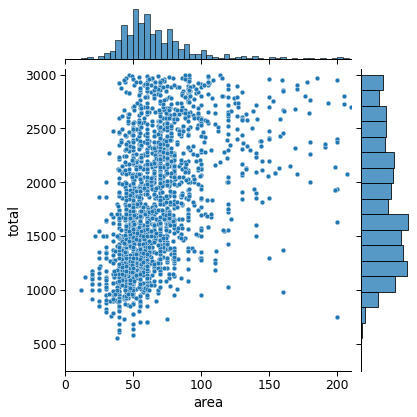

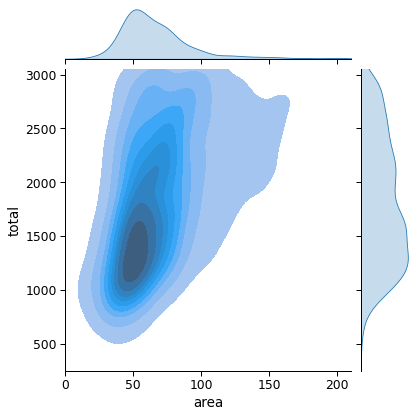

In [21]:
sns.set_context('paper', font_scale=1.4)
sns_plot = sns.jointplot(x='area', y='total', data=df, kind='scatter',xlim=(0,210),ylim=(250,3050))
sns_plot.savefig("Figures/area_rent_01.jpeg")

# sns.set_context('paper', font_scale=1.4)
# sns_plot = sns.jointplot(x='area', y='total', data=df, kind='hist',xlim=(0,210),ylim=(250,3050))
# sns_plot.savefig("Figures/area_rent_02.jpeg")

sns.set_context('paper', font_scale=1.4)
sns_plot = sns.jointplot(x='area', y='total', data=df, kind='kde',xlim=(0,210),ylim=(250,3050),fill=True)
sns_plot.savefig("Figures/area_rent_03.jpeg")

# sns.set_context('paper', font_scale=1.4)
# sns_plot = sns.jointplot(x='area', y='total', data=df, kind='reg',xlim=(0,210),ylim=(250,3050))
# sns_plot.savefig("Figures/area_rent_04.jpeg")

# sns.set_context('paper', font_scale=1.4)
# sns_plot = sns.jointplot(x='area', y='total', data=df, kind='hex',xlim=(0,210),ylim=(250,3050))
# sns_plot.savefig("Figures/area_rent_05.jpeg")

Following with a more general analysis, we plot a pair grid of all the variables.
Since some of then are discrete (you can't have 1.5 car spaces), we have some concentration regions in the graphs.

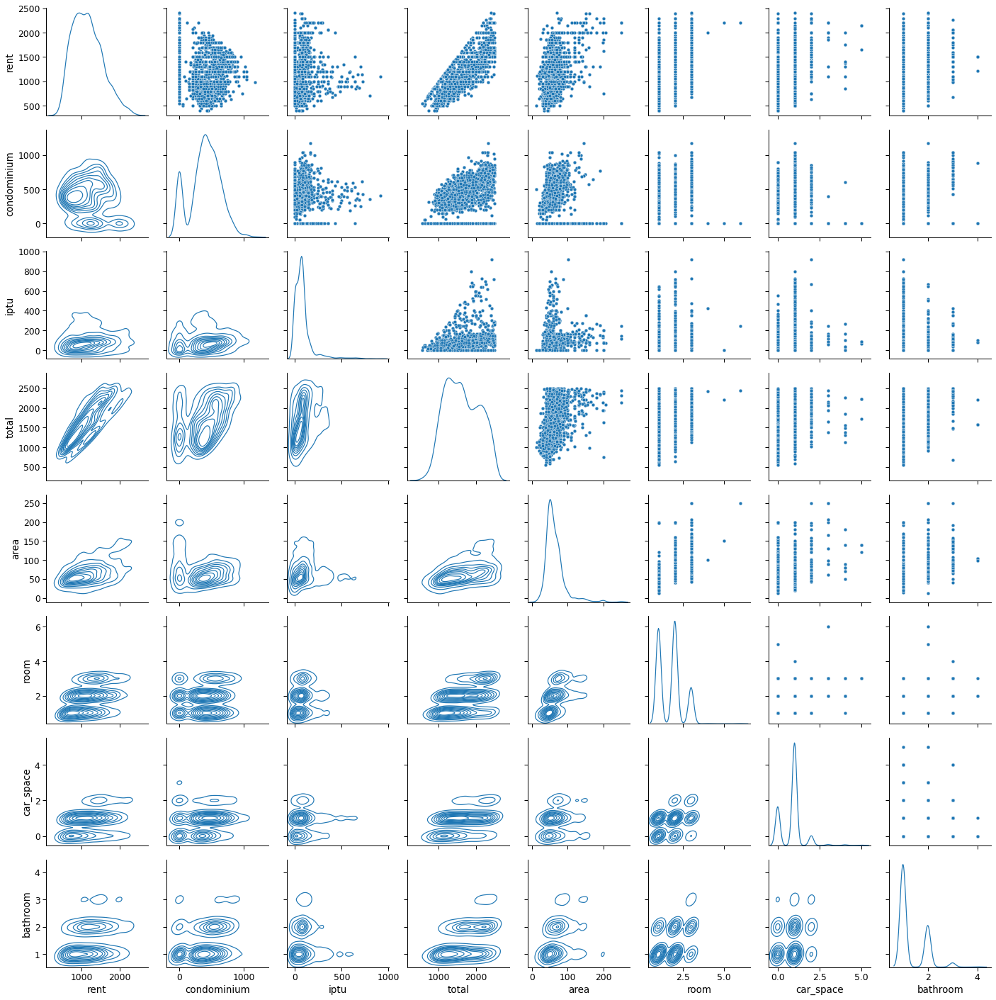

In [4]:
g = sns.PairGrid(df, diag_sharey=False)
g.map_upper(sns.scatterplot)
g.map_lower(sns.kdeplot)
g.map_diag(sns.kdeplot)
g.savefig("Figures/pair_01.jpeg")

## Properties variations
Here we see how the area and the total cost change with each other variable in these boxplots

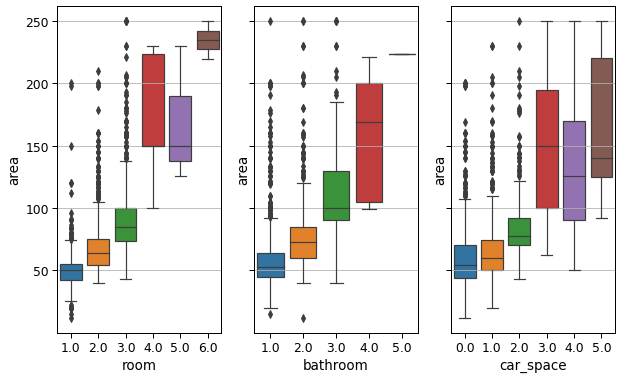

In [23]:
fig, axes = plt.subplots(1,3,sharey=True,figsize=(10,6))

g1 = sns.boxplot(y='area', x='room', data=df, ax=axes[0])
g2 = sns.boxplot(y='area', x='bathroom', data=df, ax=axes[1])
g3 = sns.boxplot(y='area', x='car_space', data=df, ax=axes[2])
g1.grid(axis='y')
g2.grid(axis='y')
g3.grid(axis='y')
# g1.xaxis.set_major_formatter(FormatStrFormatter('%g'))
# g2.set(yticklabels=[])
# g2.xaxis.set_major_formatter(FormatStrFormatter('%g'))
# g2.set(ylabel=None)
# g3.set(yticklabels=[])
# g3.xaxis.set_major_formatter(FormatStrFormatter('%g'))
# g3.set(ylabel=None)

fig.show()
fig.savefig("Figures/general_01.jpeg")

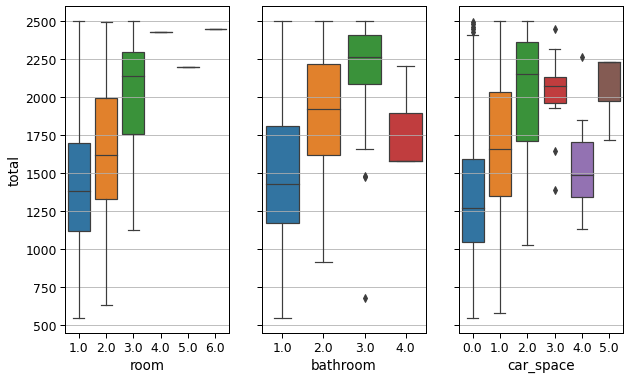

In [6]:
fig, axes = plt.subplots(1,3,sharey=True,figsize=(10,6))

g1 = sns.boxplot(y='total', x='room', data=df, ax=axes[0])
g2 = sns.boxplot(y='total', x='bathroom', data=df, ax=axes[1])
g3 = sns.boxplot(y='total', x='car_space', data=df, ax=axes[2])
g1.grid(axis='y')
g2.grid(axis='y')
g3.grid(axis='y')
# g2.set(yticklabels=[])
# g2.xaxis.set_major_formatter(FormatStrFormatter('%g'))
g2.set(ylabel=None)
# g3.set(yticklabels=[])
# g3.xaxis.set_major_formatter(FormatStrFormatter('%g'))
g3.set(ylabel=None)

fig.show()
fig.savefig("Figures/general_02.jpeg")

## Variables distribution 
Here we see how the secondary variables are distributed.
We can see how little samples exist with higher numbers of rooms, bathrooms or car spaces.

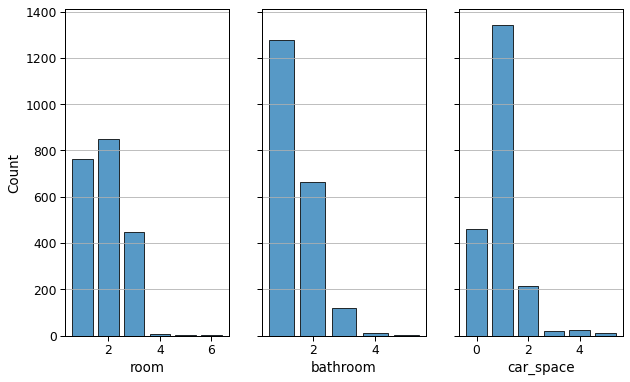

In [42]:
fig, axes = plt.subplots(1,3,sharey=True,figsize=(10,6))

g1 = sns.histplot(x='room', data=df, ax=axes[0], discrete=True, shrink=.8)
g2 = sns.histplot(x='bathroom', data=df, ax=axes[1], discrete=True, shrink=.8)
g3 = sns.histplot(x='car_space', data=df, ax=axes[2], discrete=True, shrink=.8)
g1.grid(axis='y')
g2.grid(axis='y')
g3.grid(axis='y')

g2.set(ylabel=None)
g3.set(ylabel=None)

fig.show()
fig.savefig("Figures/general_03.jpeg")

# Conclusions
As expected, the prices go up as we increase the number of rooms, bathrooms or car spaces. The same pattern follow for the area but not so strong for car spaces, since they don't contribute in a house total area.
Due to the lack of samples in the +75m^2 area, the data can behave too uncertainty and disperse.
There is a lot of options in the R\$1000 to R\$1500 price range and 25 to 75m^2 area but those offers have usually 1/2 rooms, 1 bathroom and 1/2 car spaces, which could be small for certain families.

# Possible bias
Our original data came from a single website, so depending of the type of person who access the site and make house offers we could have a tendency to certain variety of offers, like cheaper houses, smaller houses or a lot of people from a certain city and not so much from others.
An alternative would be to compare this data with another website. This could lead to duplicated samples, so would be better to analyse them independently.
For that, another web scrapping would have to be made and run in this same jupyter python code.